In [ ]:
import tensorflow as tf
from tensorflow.keras.models import Model
from tensorflow.keras.optimizers import SGD, Adam
from tensorflow.keras.layers import Input, Dense, LeakyReLU, Dropout, BatchNormalization

import sys, os
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt

# Load Data

In [ ]:
(x_train, y_train), (x_test, y_test) = tf.keras.datasets.mnist.load_data()

# map inputs to (-1, +1) for better training
x_train, x_test = x_train/255.0 * 2 - 1, x_test/255.0 * 2 - 1

print('shape: ', x_train.shape)

11490434/11490434 [==============================] - 0s 0us/step
shape:  (60000, 28, 28)


Flatten data

In [ ]:
N, H, W = x_train.shape
D = H* W
x_train = x_train.reshape(-1, D)
x_test = x_test.reshape(-1, D)

# Initialize the latent space Dimensionality
latent_dim = 100

# Build Generator

In [ ]:
def build_generator(latent_dim):
  i = Input(shape = (latent_dim, ))
  x = Dense(256, activation = LeakyReLU(alpha = 0.2))(i)
  x = BatchNormalization(momentum = 0.8)(x)
  x = Dense(512, activation = LeakyReLU(alpha = 0.2))(x)
  x = BatchNormalization(momentum = 0.8)(x)
  x = Dense(1024, activation = LeakyReLU(alpha = 0.2))(x)
  x = BatchNormalization(momentum = 0.8)(x)
  x = Dense(D, activation = 'tanh')(x)

  return Model(i, x)

# Build Discriminator

In [ ]:
def build_discriminator(img_size):
  i = Input(shape = (img_size, ))
  x = Dense(512, activation = LeakyReLU(alpha = 0.2))(i)
  x = Dense(256, activation = LeakyReLU(alpha = 0.2))(x)
  x = Dense(1, activation = 'sigmoid')(x)
  return Model(i, x)

# GAN model Initialization

In [ ]:
discriminator = build_discriminator(D)
discriminator.compile(loss = 'binary_crossentropy', optimizer = Adam(0.0002, 0.5), metrics = ['accuracy']) # Compile discriminator

generator = build_generator(latent_dim) # compile combined model

z = Input(shape = (latent_dim, )) # create input to represent noise
img = generator(z) # pass noise through generator to get an image

# make only generator is trained
discriminator.trainable = False

# get the pred of the generated image
fake_pred = discriminator(img)

# create combined model
combined_model = Model(z, fake_pred)
combined_model.compile(loss = 'binary_crossentropy', optimizer = Adam(0.0002, 0.5))


# Train GAN

In [ ]:
# config
batch_size = 32
epochs = 30000
sample_period = 200

# create batch labels to use when calling train_on_batch
ones = np.ones(batch_size)
zeros = np.zeros(batch_size)

# store losses
d_losses = []
g_losses = []

# create a folder to store generated images
if not os.path.exists('gan_images'):
  os.makedirs('gan_images')

### function to plot the data

In [ ]:
# plot random samples from the generator
def sample_images(epoch):
  rows, cols = 5, 5
  noise = np.random.randn(rows * cols, latent_dim)
  imgs = generator.predict(noise)

  # resacale images 0 - 1
  imgs = 0.5 * imgs + 0.5

  fig, axs = plt.subplots(rows, cols)
  idx = 0
  for i in range(rows):
    for j in range(cols):
      axs[i, j].imshow(imgs[idx].reshape(H, W), cmap = 'gray')
      axs[i, j].axis('off')
      idx += 1
  fig.savefig('gan_images/%d.png' % epoch)
  plt.close

# Training

1/1 [==============================] - 2s 2s/step
epoch: 1/ 30000, d_loss: 0.67,             d_acc: 0.69, g_loss: 0.87
1/1 [==============================] - 0s 15ms/step
epoch: 101/ 30000, d_loss: 0.01,             d_acc: 1.00, g_loss: 4.78
1/1 [==============================] - 0s 19ms/step
epoch: 201/ 30000, d_loss: 0.19,             d_acc: 0.95, g_loss: 4.49
1/1 [==============================] - 0s 15ms/step
epoch: 301/ 30000, d_loss: 0.11,             d_acc: 0.97, g_loss: 4.96
1/1 [==============================] - 0s 13ms/step
epoch: 401/ 30000, d_loss: 0.51,             d_acc: 0.75, g_loss: 2.54
1/1 [==============================] - 0s 18ms/step
epoch: 501/ 30000, d_loss: 0.68,             d_acc: 0.48, g_loss: 0.71
1/1 [==============================] - 0s 13ms/step
epoch: 601/ 30000, d_loss: 0.60,             d_acc: 0.70, g_loss: 0.75
1/1 [==============================] - 0s 21ms/step
epoch: 701/ 30000, d_loss: 0.61,             d_acc: 0.70, g_loss: 0.75
1/1 [===============

<ipython-input-14-7630e9f88001>:10: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  fig, axs = plt.subplots(rows, cols)


Streaming output truncated to the last 5000 lines.
1/1 [==============================] - 0s 18ms/step
epoch: 25101/ 30000, d_loss: 0.66,             d_acc: 0.64, g_loss: 0.97
1/1 [==============================] - 0s 18ms/step
epoch: 25201/ 30000, d_loss: 0.65,             d_acc: 0.59, g_loss: 1.08
1/1 [==============================] - 0s 31ms/step
epoch: 25301/ 30000, d_loss: 0.60,             d_acc: 0.69, g_loss: 1.00
1/1 [==============================] - 0s 20ms/step
epoch: 25401/ 30000, d_loss: 0.58,             d_acc: 0.62, g_loss: 1.01
1/1 [==============================] - 0s 17ms/step
epoch: 25501/ 30000, d_loss: 0.66,             d_acc: 0.66, g_loss: 1.08
1/1 [==============================] - 0s 48ms/step
epoch: 25601/ 30000, d_loss: 0.61,             d_acc: 0.72, g_loss: 0.97
1/1 [==============================] - 0s 18ms/step
epoch: 25701/ 30000, d_loss: 0.69,             d_acc: 0.59, g_loss: 1.04
1/1 [==============================] - 0s 18ms/step
epoch: 25801/ 30000, d

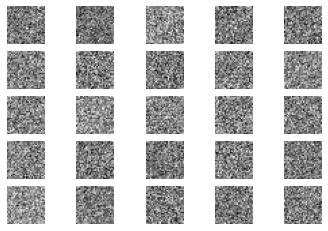

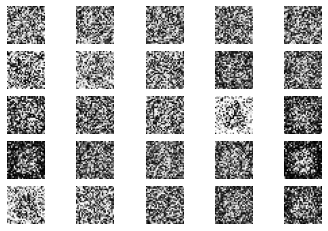

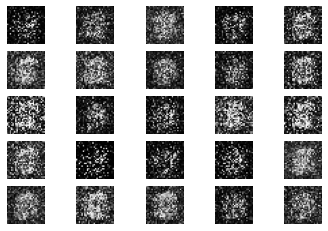

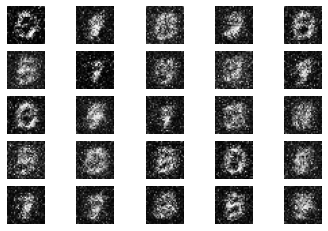

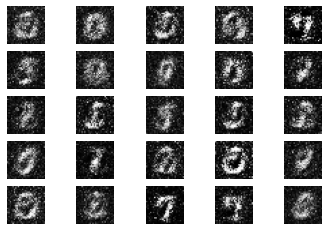

...

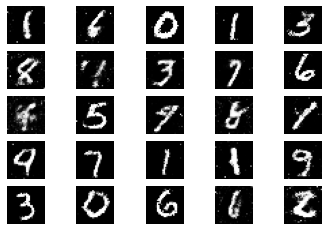

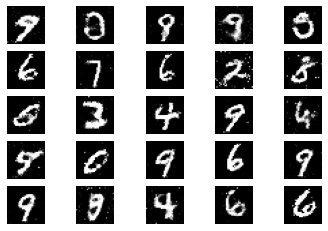

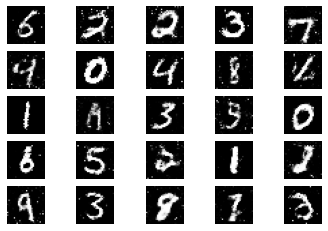

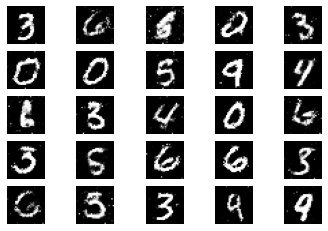

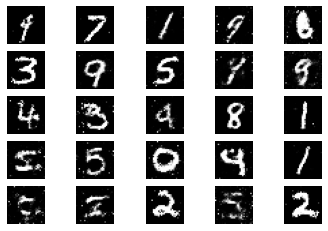

In [ ]:
for epoch in range (epochs):
  # train discriminator
  #--------------------
  idx = np.random.randint(0, x_train.shape[0], batch_size) # select random batch of iamges
  real_imgs = x_train[idx]

  # Generate Fake images
  noise = np.random.randn(batch_size, latent_dim)
  fake_imgs = generator.predict(noise)

  # train dicriminator
  d_loss_real, d_acc_real = discriminator.train_on_batch(real_imgs, ones)
  d_loss_fake, d_acc_fake = discriminator.train_on_batch(fake_imgs, zeros)
  # get the overall acc and loss through getting the mean value of each
  d_loss = 0.5 * (d_loss_real + d_loss_fake)
  d_acc = 0.5 * (d_acc_real + d_acc_fake)

  # train generator
  #----------------

  noise = np.random.randn(batch_size, latent_dim)
  g_loss = combined_model.train_on_batch(noise, ones)

  # save losses
  d_losses.append(d_loss)
  g_losses.append(g_loss)

  if epoch %100 == 0:
    print(f'epoch: {epoch + 1}/ {epochs}, d_loss: {d_loss:.2f}, \
            d_acc: {d_acc:.2f}, g_loss: {g_loss:.2f}')
  if epoch % sample_period == 0:
    sample_images(epoch)

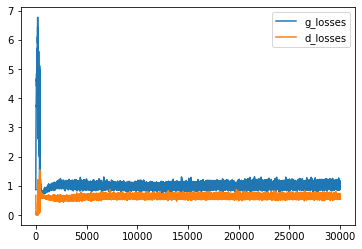

In [ ]:
plt.plot(g_losses, label = 'g_losses')
plt.plot(d_losses, label = 'd_losses')
plt.legend()

In [ ]:
# plot the zero epoch image
from skimage.io import imread
a = imread('gan_images/0.png')
plt.imshow

<function matplotlib.pyplot.imshow(X, cmap=None, norm=None, aspect=None, interpolation=None, alpha=None, vmin=None, vmax=None, origin=None, extent=None, shape=<deprecated parameter>, filternorm=1, filterrad=4.0, imlim=<deprecated parameter>, resample=None, url=None, *, data=None, **kwargs)>

In [ ]:
# plot the 1000 epoch image
from skimage.io import imread
a = imread('gan_images/1000.png')
plt.imshow

<function matplotlib.pyplot.imshow(X, cmap=None, norm=None, aspect=None, interpolation=None, alpha=None, vmin=None, vmax=None, origin=None, extent=None, shape=<deprecated parameter>, filternorm=1, filterrad=4.0, imlim=<deprecated parameter>, resample=None, url=None, *, data=None, **kwargs)>

In [ ]:
# plot the 10000 epoch image
from skimage.io import imread
a = imread('gan_images/10000.png')
plt.imshow

<function matplotlib.pyplot.imshow(X, cmap=None, norm=None, aspect=None, interpolation=None, alpha=None, vmin=None, vmax=None, origin=None, extent=None, shape=<deprecated parameter>, filternorm=1, filterrad=4.0, imlim=<deprecated parameter>, resample=None, url=None, *, data=None, **kwargs)>

In [ ]:
# plot the 20000 epoch image
from skimage.io import imread
a = imread('gan_images/20000.png')
plt.imshow

<function matplotlib.pyplot.imshow(X, cmap=None, norm=None, aspect=None, interpolation=None, alpha=None, vmin=None, vmax=None, origin=None, extent=None, shape=<deprecated parameter>, filternorm=1, filterrad=4.0, imlim=<deprecated parameter>, resample=None, url=None, *, data=None, **kwargs)>

In [ ]:
# plot the 29000 epoch image
from skimage.io import imread
a = imread('gan_images/29000.png')
plt.imshow

<function matplotlib.pyplot.imshow(X, cmap=None, norm=None, aspect=None, interpolation=None, alpha=None, vmin=None, vmax=None, origin=None, extent=None, shape=<deprecated parameter>, filternorm=1, filterrad=4.0, imlim=<deprecated parameter>, resample=None, url=None, *, data=None, **kwargs)>